<a href="https://colab.research.google.com/github/beamaia/cvae-clustering/blob/main/histvae.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
! pip install torch \
torchvision \
matplotlib \
numpy \
scikit-learn \
opencv-python \
openslide-python \
pandas \
Pillow \
scipy \
wandb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.0/359.0 kB 8.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 76.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.4/195.4 kB 29.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 258.8/258.8 kB 33.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 10.3 MB/s eta 0:00:00
  Created wheel for openslide-python: filename=openslide_python-1.3.1-cp310-cp310-linux_x86_64.whl size=33547 sha256=1775103e500c43e6baf29fece82df70ebc2d063460fd3e3cb7bb4797dcbcc832
  Stored in directory: /root/.cache/pip/wheels/79/79/fa/29a0087493c69dff7fd0b70fab5d6771002a531010161d2d97
Successfully built openslide-python


**Based on [HistoVAE](https://github.com/beamaia/HistoVAE/blob/main/src/models.py)**

In [ ]:
#torch==2.2.1
#torchvision==0.17.1
#matplotlib==3.8.3
#numpy==1.26.4
#opencv-python==4.9.0.80
#pandas==2.2.0
#Pillow==10.2.0
#scipy==1.12.0
#wandb==0.16.3

In [ ]:
import torch
from torch import nn
from math import log
from torch.nn import functional as F
import torchvision.transforms as T
import numpy as np

In [ ]:
!pip install -Uqq ipdb
import ipdb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 27.0 MB/s eta 0:00:00


In [ ]:
%pdb off

Automatic pdb calling has been turned OFF


In [ ]:
from mpl_toolkits.axes_grid1 import ImageGrid

In [ ]:
class View(nn.Module):
    def __init__(self, shape):
        super(View, self).__init__()
        self.shape = shape

    def forward(self, x):
        return x.view(*self.shape)

In [ ]:
class VCAE(nn.Module):
    def __init__(self, inner_dim:int = 2048, dropout_rate:float = 0., device='cpu'):
        super(VCAE, self).__init__()
        self.inner_dim = inner_dim
        self.dropout_rate = dropout_rate
        self.epsilon_std = 1.0

        self.device = device

        # self.encoder = self._define_encoder().to(device)
        # self.decoder = self._define_decoder().to(device)

        self.z_mean = nn.Linear(128* 12* 12, self.inner_dim).to(device)
        self.z_log_var = nn.Linear(128* 12* 12, self.inner_dim).to(device)


    def _define_encoder(self, x=None):
         return nn.Sequential(nn.Conv2d(3, 16, kernel_size=3),
                            nn.LeakyReLU(),
                            nn.AvgPool2d(kernel_size=2, stride=2),

                            nn.Conv2d(16, 32, kernel_size=3),
                            nn.LeakyReLU(),
                            nn.AvgPool2d(kernel_size=2, stride=2),

                            nn.Conv2d(32, 64, kernel_size=3),
                            nn.LeakyReLU(),
                            nn.AvgPool2d(kernel_size=2, stride=2),

                            nn.Conv2d(64, 128, kernel_size=3),
                            nn.LeakyReLU(),
                            nn.AvgPool2d(kernel_size=2, stride=2),

                            nn.Flatten(),
                            nn.Dropout(self.dropout_rate)
                            )


    def _define_decoder(self):
        return nn.Sequential(nn.Dropout(self.dropout_rate),
                            nn.Linear(self.inner_dim, 128*12*12),
                            View((-1, 128, 12, 12)),

                            nn.Upsample(size=(24, 24)),
                            nn.LeakyReLU(),
                            nn.ConvTranspose2d(128, 64, kernel_size=3),

                            nn.Upsample(size=(52, 52)),
                            nn.LeakyReLU(),
                            nn.ConvTranspose2d(64, 32, kernel_size=3),


                            nn.Upsample(size=(109, 109)),
                            nn.LeakyReLU(),
                            nn.ConvTranspose2d(32, 16, kernel_size=3),

                            nn.Upsample(size=(223, 223)),
                            nn.LeakyReLU(),
                            nn.ConvTranspose2d(16, 3, kernel_size=3),
                            nn.Sigmoid()
                            )

    def _resize_input(self, image):
        if image.shape[2] == 225 and image.shape[3] == 225:
            return image
        return T.Resize(size=225)(image).to(self.device)


    def encode(self, image):
        self.indices = [0,0,0,0]
        x = nn.Conv2d(3, 16, kernel_size=3).to(self.device)(image)
        x = nn.LeakyReLU().to(self.device)(x)
        print(x.shape)
        x, self.indices[0] = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True).to(self.device)(x)
        print(x.shape)
        x = nn.Conv2d(16, 32, kernel_size=3).to(self.device)(x)
        x = nn.LeakyReLU().to(self.device)(x)
        print(x.shape)
        x, self.indices[1] = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True).to(self.device)(x)
        print(x.shape)
        x = nn.Conv2d(32, 64, kernel_size=3).to(self.device)(x)
        x = nn.LeakyReLU().to(self.device)(x)
        print(x.shape)
        x, self.indices[2] = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True).to(self.device)(x)
        print(x.shape)
        x = nn.Conv2d(64, 128, kernel_size=3).to(self.device)(x)
        x = nn.LeakyReLU().to(self.device)(x)
        print(x.shape)
        x, self.indices[3] = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True).to(self.device)(x)
        print(x.shape)
        x = nn.Flatten().to(self.device)(x)
        x = nn.Dropout(self.dropout_rate).to(self.device)(x)

        z_mean = self.z_mean(x)
        z_log_var = self.z_log_var(x)
        return z_mean, z_log_var

    def decode(self, features):

        # torch.Size([32, 16, 223, 223])
        # torch.Size([32, 16, 111, 111])
        # torch.Size([32, 32, 109, 109])
        # torch.Size([32, 32, 54, 54])
        # torch.Size([32, 64, 52, 52])
        # torch.Size([32, 64, 26, 26])
        # torch.Size([32, 128, 24, 24])
        # torch.Size([32, 128, 12, 12])


        x = nn.Dropout(self.dropout_rate)(features).to(self.device)
        x = nn.Linear(self.inner_dim, 128*12*12).to(self.device)(x)
        x = View((-1, 128, 12, 12)).to(self.device)(x)

        print(x.shape, self.indices[3].shape)
        x = nn.MaxUnpool2d(kernel_size=2, stride=2).to(self.device)(x, self.indices[3], output_size=(24, 24))
        x = nn.LeakyReLU().to(self.device)(x)
        print("Leakyrelu1", x.shape)
        x = nn.ConvTranspose2d(128, 64, kernel_size=3).to(self.device)(x)

        x = nn.MaxUnpool2d(kernel_size=2, stride=2).to(self.device)(x, self.indices[2], output_size=(52, 52))
        x = nn.LeakyReLU().to(self.device)(x)
        print("Leakyrelu2", x.shape)
        x = nn.ConvTranspose2d(64, 32, kernel_size=3).to(self.device)(x)


        x = nn.MaxUnpool2d(kernel_size=2, stride=2).to(self.device)(x, self.indices[1], output_size=(109, 109))
        x = nn.LeakyReLU().to(self.device)(x)
        print("Leakyrelu3", x.shape)
        x = nn.ConvTranspose2d(32, 16, kernel_size=3).to(self.device)(x)

        x = nn.MaxUnpool2d(kernel_size=2, stride=2).to(self.device)(x, self.indices[0], output_size=(223, 223))
        x = nn.LeakyReLU().to(self.device)(x)
        print("relu4", x.shape)
        x = nn.ConvTranspose2d(16, 3, kernel_size=3).to(self.device)(x)
        x = nn.Sigmoid().to(self.device)(x)
        return x

    def plot_images(self, x):
        fig = plt.figure(figsize=(4., 4.))
        grid = ImageGrid(fig, 111,  # similar to subplot(111)
                        nrows_ncols=(4, 6),  # creates 2x2 grid of axes
                        axes_pad=0.1,  # pad between axes in inch.
                        )

        print(np.min(np.array(x.flatten())), np.max(np.array(x.flatten())))
        for ax, im in zip(grid, x):
            # Iteratizng over the grid returns the Axes.
            ax.imshow(im.T)

        plt.show()

    def sampling(self, z_mean, z_log_var):
        epsilon = torch.normal(size=(z_mean.shape[0], self.inner_dim), mean=0, std=self.epsilon_std).to(self.device)
        return z_mean + torch.exp(z_log_var) * epsilon


    def forward(self, x: torch.Tensor) -> torch.Tensor:
        print("before resize")
        self.plot_images(x.cpu())
        x = self._resize_input(x)
        print("after resize")
        self.plot_images(x.cpu())
        z_mean, z_log_var = self.encode(x)
        z = self.sampling(z_mean, z_log_var)
        print("after encoder and decoded")
        decoded = self.decode(z)
        self.plot_images(decoded.detach().cpu().numpy())
        # ipdb.set_trace()
        return x, z_mean, z_log_var, z, decoded



In [ ]:
image = torch.randint(0, 255, (3, 3, 225, 225), dtype=torch.float32)

In [ ]:
vae = VCAE(dropout_rate=0.5)

In [ ]:
features = vae.encode(image)

---

In [ ]:
import torchvision
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, Dataset, TensorDataset

In [ ]:
import pathlib as pl
from glob import glob

In [ ]:
from PIL import Image

In [ ]:
class PNDBDataset(Dataset):
    """P-NDB-Dataset"""

    def __init__(self, folder_path, transform=None):
        """
        Arguments:
            csv_file (string): Path to the csv file with annotations.
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.path = folder_path
        self.classes_to_idx = {
            "carcinoma": 0,
            "no_dysplasia": 1,
            "with_dysplasia": 2
        }

        self.img_transform = T.Compose([T.PILToTensor()])
        self.transform = transform
        self._organize_image()


    def _load_image(self, path):
        im = Image.open(path)
        im = self.img_transform(im)
        im = T.Resize(size=225)(im)
        return im

    def _organize_image(self):
        carcinoma_images_path = pl.Path(f"{self.path}/carcinoma")
        no_dysplasia_images_path = pl.Path(f"{self.path}/no_dysplasia")
        dysplasia_images_path = pl.Path(f"{self.path}/dysplasia")

        carcinoma_images = glob(f'{str(carcinoma_images_path)}/*.png')
        no_dysplasia_images = glob(f'{str(no_dysplasia_images_path)}/*.png')
        dysplasia_images = glob(f'{str(dysplasia_images_path)}/*.png')

        carcinoma_image_list = [self._load_image(path) for path in carcinoma_images]
        no_dysplasia_image_list = [self._load_image(path) for path in no_dysplasia_images]
        dysplasia_image_list = [self._load_image(path) for path in dysplasia_images]

        carcinoma_targets = torch.zeros(len(carcinoma_images))
        no_dysplasia_targets = torch.ones(len(no_dysplasia_images))
        dysplasia_targets = torch.ones(len(dysplasia_images)) * 2

        images_list = []
        images_list.extend(carcinoma_image_list)
        images_list.extend(no_dysplasia_image_list)
        images_list.extend(dysplasia_image_list)

        targets_list = []
        targets_list.extend(carcinoma_targets)
        targets_list.extend(no_dysplasia_targets)
        targets_list.extend(dysplasia_targets)

        self.data = torch.tensor(np.array(images_list)) / 1.
        self.target = torch.tensor(targets_list)

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        image = self.data[idx]
        target = self.target[idx]

        if self.transform:
            image = self.transform(image)

        return image, target

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install patool
import patoolib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.0/96.0 kB 1.4 MB/s eta 0:00:00


In [ ]:
patoolib.extract_archive('/content/drive/MyDrive/dataset/data_train_test.zip')

INFO patool: Extracting /content/drive/MyDrive/dataset/data_train_test.zip ...
INFO:patool:Extracting /content/drive/MyDrive/dataset/data_train_test.zip ...
INFO patool: running /usr/bin/7z x -o./Unpack_xe89don5 -- /content/drive/MyDrive/dataset/data_train_test.zip
INFO:patool:running /usr/bin/7z x -o./Unpack_xe89don5 -- /content/drive/MyDrive/dataset/data_train_test.zip
INFO patool:     with input=''
INFO:patool:    with input=''
INFO patool: ... /content/drive/MyDrive/dataset/data_train_test.zip extracted to `data'.
INFO:patool:... /content/drive/MyDrive/dataset/data_train_test.zip extracted to `data'.


'data'

In [ ]:
learning_rate = 1e-1
batch_size = 32
epochs = 200

In [ ]:
train_dataset = PNDBDataset("/content/data/train")
test_dataset = PNDBDataset("/content/data/test")

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


In [ ]:
train_dataset = torchvision.datasets.CIFAR10(root="/content/data/", train=True, download = True, transform=T.Compose([T.ToTensor()]))
test_dataset = torchvision.datasets.CIFAR10(root="/content/data/", train=False, download = True, transform=T.Compose([T.ToTensor()]))

Files already downloaded and verified
Files already downloaded and verified


In [ ]:
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

In [ ]:
device = torch.device('cuda')

In [ ]:
vae = VCAE(dropout_rate=0.1, device=device)

In [ ]:
optimizer = torch.optim.Adam(vae.parameters(), lr=learning_rate)

In [ ]:
loss_fn = F.mse_loss

In [ ]:
!pip install wandb
import wandb

In [ ]:
wandb.login(key='93f925fc9f2f23496ef213c0ef47fd3bb280724d')

wandb: WARNING Calling wandb.login() after wandb.init() has no effect.


True

In [ ]:
beta = 1
alpha = 10**(-5)

In [ ]:
wandb.init(
        project="tcc",
        config={
            "epochs": epochs,
            "batch_size": batch_size,
            "lr": learning_rate,
            "optimizer": "SGD",
            "alpha": alpha,
            "beta": beta
            })

In [ ]:
def _resize_input(image, device):
    if image.shape[2] == 225 and image.shape[3] == 225:
        return image
    return T.Resize(size=225)(image).to(device)

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
def sampling(z_mean, z_log_var):
    return z_mean + torch.exp(z_log_var) * 0.5

Epoch: 0
before resize


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


0.0 1.0


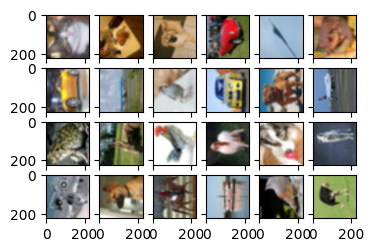

after resize
0.0 1.0


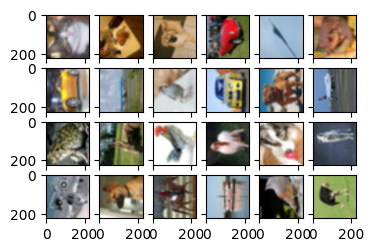

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.49478367 0.55476683


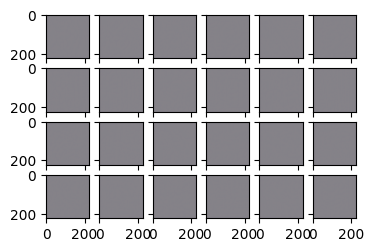

tensor(6202.9492, device='cuda:0', grad_fn=<MulBackward0>) tensor(0.3611, device='cuda:0', grad_fn=<MulBackward0>) tensor(6203.3105, device='cuda:0', grad_fn=<AddBackward0>)
pixelwise tensor(310147.4688, device='cuda:0', grad_fn=<MseLossBackward0>)
kl tensor([0.3815, 0.3386, 0.3556, 0.3427, 0.4001, 0.3349, 0.3615, 0.3517, 0.4169,
        0.4013, 0.3686, 0.3255, 0.3473, 0.3264, 0.4715, 0.3551, 0.4369, 0.3177,
        0.3684, 0.3524, 0.3383, 0.3957, 0.3340, 0.3182, 0.3945, 0.3102, 0.3339,
        0.3606, 0.3760, 0.3035, 0.3488, 0.3875], device='cuda:0',
       grad_fn=<MulBackward0>)
loss tensor(6203.3105, device='cuda:0', grad_fn=<MeanBackward0>)

before resize
9.615065e-05 1.0


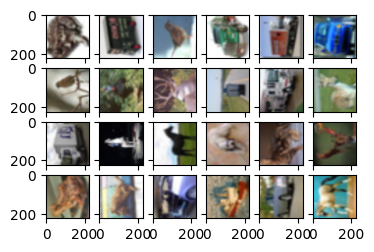

after resize
9.615065e-05 1.0


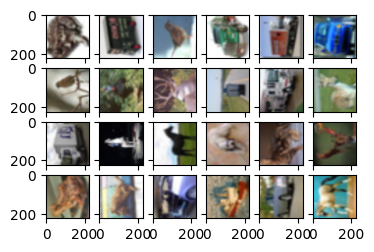

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.0 1.0


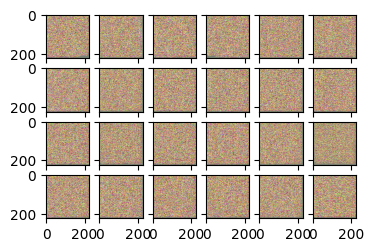

tensor(27617.4141, device='cuda:0', grad_fn=<MulBackward0>) tensor(4939019., device='cuda:0', grad_fn=<MulBackward0>) tensor(4966636.5000, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


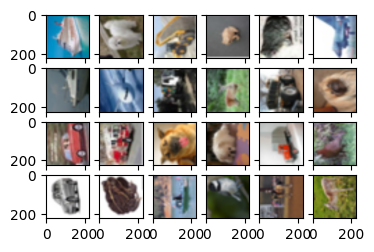

after resize
0.0 1.0


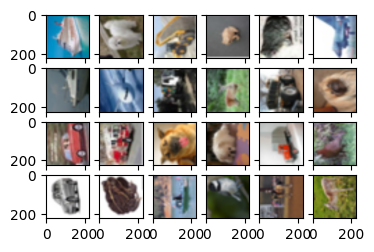

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.2821909 0.812894


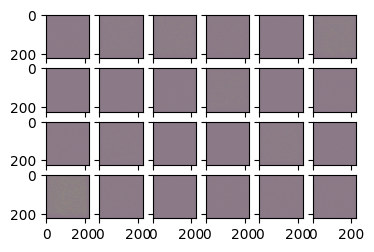

tensor(5949.4619, device='cuda:0', grad_fn=<MulBackward0>) tensor(6629.1538, device='cuda:0', grad_fn=<MulBackward0>) tensor(12578.6152, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


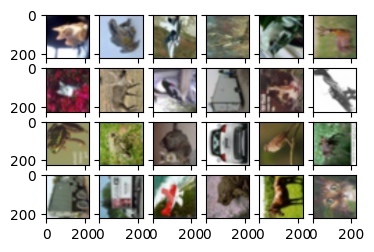

after resize
0.0 1.0


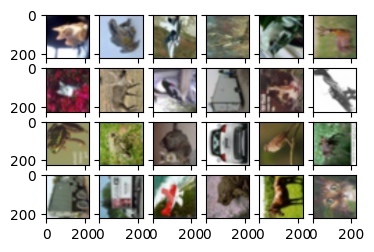

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.0 1.0


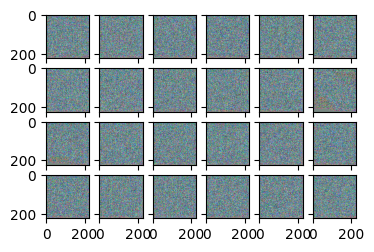

tensor(29640.3438, device='cuda:0', grad_fn=<MulBackward0>) tensor(1.4289e+10, device='cuda:0', grad_fn=<MulBackward0>) tensor(1.4289e+10, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


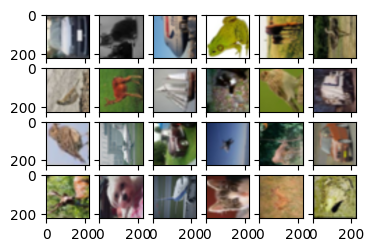

after resize
0.0 1.0


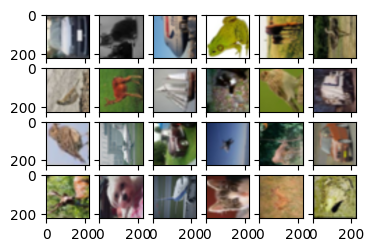

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.0 1.0


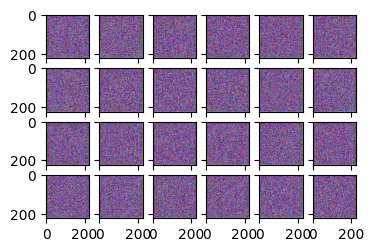

tensor(28986.1289, device='cuda:0', grad_fn=<MulBackward0>) tensor(5707197., device='cuda:0', grad_fn=<MulBackward0>) tensor(5736183., device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


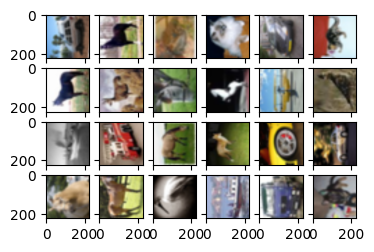

after resize
0.0 1.0


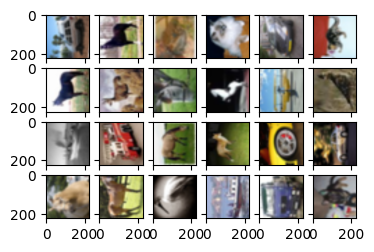

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.0 1.0


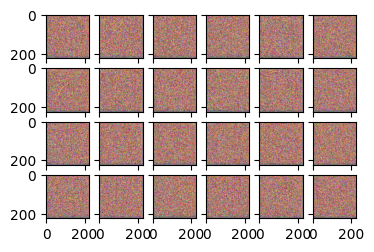

tensor(29559.3789, device='cuda:0', grad_fn=<MulBackward0>) tensor(9.1250e+09, device='cuda:0', grad_fn=<MulBackward0>) tensor(9.1250e+09, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


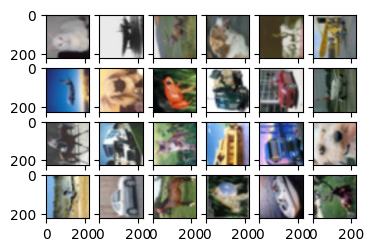

after resize
0.0 1.0


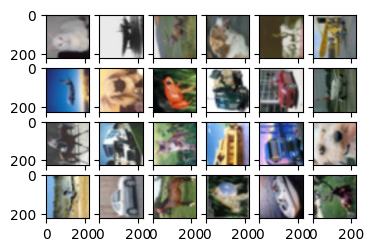

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.0 1.0


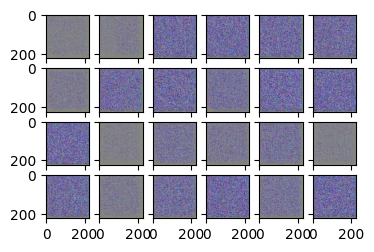

tensor(18380.0273, device='cuda:0', grad_fn=<MulBackward0>) tensor(80940.4766, device='cuda:0', grad_fn=<MulBackward0>) tensor(99320.5000, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


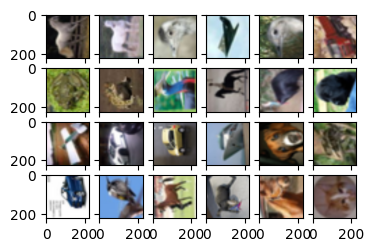

after resize
0.0 1.0


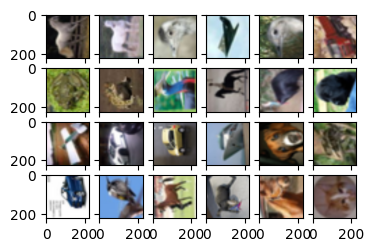

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.0 1.0


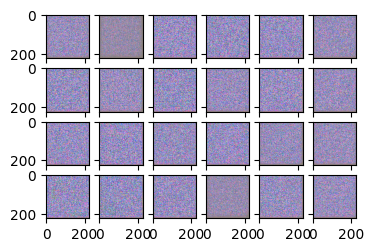

tensor(24326.6152, device='cuda:0', grad_fn=<MulBackward0>) tensor(192623.4375, device='cuda:0', grad_fn=<MulBackward0>) tensor(216950.0469, device='cuda:0', grad_fn=<AddBackward0>)
before resize
1.0670664e-05 1.0


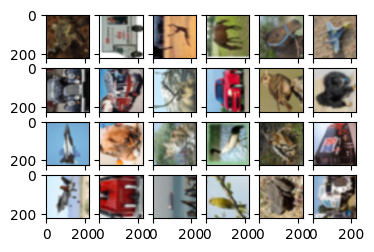

after resize
1.0670664e-05 1.0


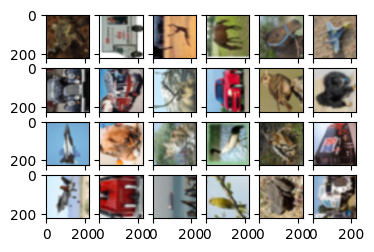

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.0 1.0


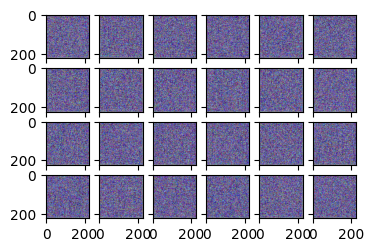

tensor(29616.1719, device='cuda:0', grad_fn=<MulBackward0>) tensor(5853670., device='cuda:0', grad_fn=<MulBackward0>) tensor(5883286., device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


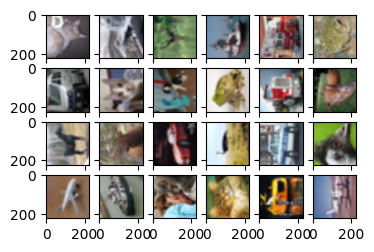

after resize
0.0 1.0


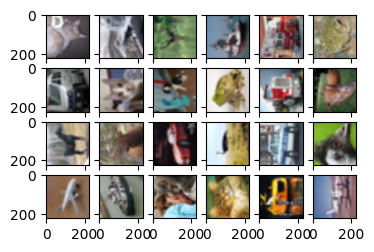

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.38584554 0.6667281


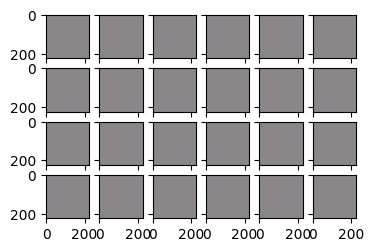

tensor(5480.6167, device='cuda:0', grad_fn=<MulBackward0>) tensor(135270.5312, device='cuda:0', grad_fn=<MulBackward0>) tensor(140751.1406, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


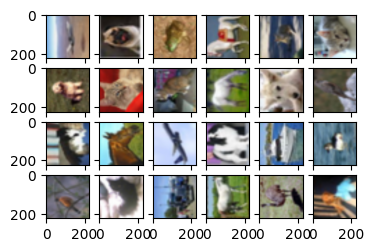

after resize
0.0 1.0


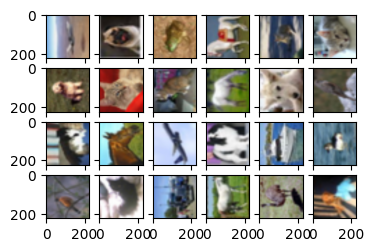

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.36395442 0.61178756


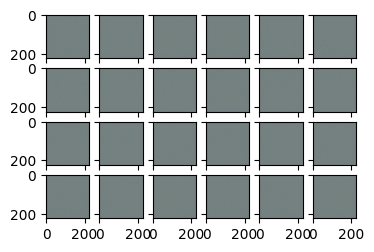

tensor(5381.3359, device='cuda:0', grad_fn=<MulBackward0>) tensor(102514.0938, device='cuda:0', grad_fn=<MulBackward0>) tensor(107895.4297, device='cuda:0', grad_fn=<AddBackward0>)
pixelwise tensor(269066.8125, device='cuda:0', grad_fn=<MseLossBackward0>)
kl tensor([ 97347.4531, 110627.0469, 107876.2266, 107748.9766, 105710.1562,
        102228.0078, 108595.9219, 100936.1250, 102967.5859, 106718.3750,
         94202.9609, 109023.1016, 101233.9453, 107473.8750,  96354.5547,
        101820.7969,  98900.6875,  96373.2969,  93210.2656,  97256.2969,
        108647.3359, 104574.1328,  95910.7969, 105104.3438, 101805.0781,
        103127.5781,  93099.8906, 111067.0938, 110559.7969,  95438.6094,
        101146.1562, 103364.6562], device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(107895.4297, device='cuda:0', grad_fn=<MeanBackward0>)

before resize
0.0 1.0


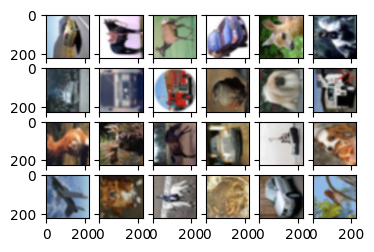

after resize
0.0 1.0


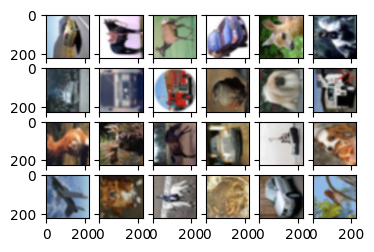

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.40366098 0.63709176


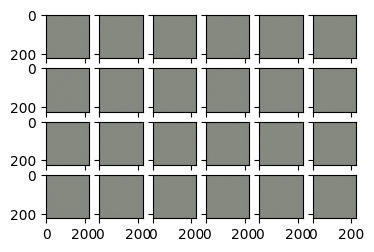

tensor(6261.9204, device='cuda:0', grad_fn=<MulBackward0>) tensor(108725.2422, device='cuda:0', grad_fn=<MulBackward0>) tensor(114987.1641, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.00026406345 1.0


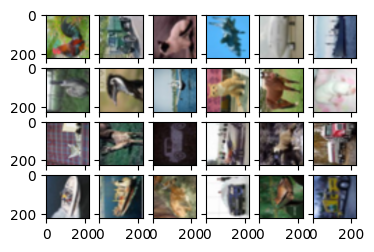

after resize
0.00026406345 1.0


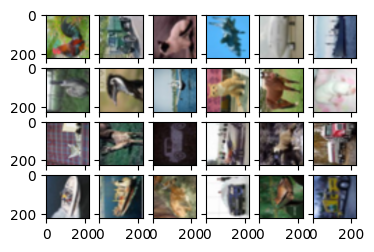

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.0 1.0


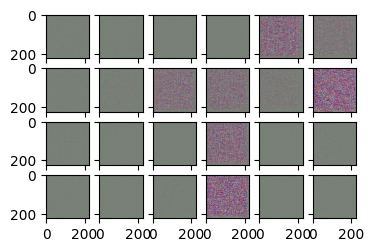

tensor(8521.9385, device='cuda:0', grad_fn=<MulBackward0>) tensor(357308.9062, device='cuda:0', grad_fn=<MulBackward0>) tensor(365830.8438, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


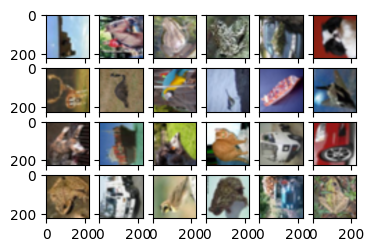

after resize
0.0 1.0


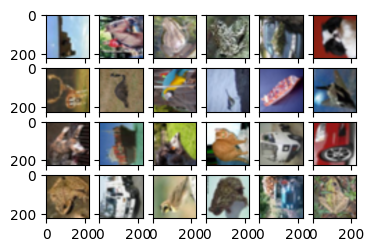

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.41495627 0.61642087


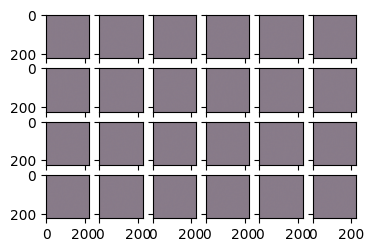

tensor(5317.6636, device='cuda:0', grad_fn=<MulBackward0>) tensor(64188.3477, device='cuda:0', grad_fn=<MulBackward0>) tensor(69506.0078, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


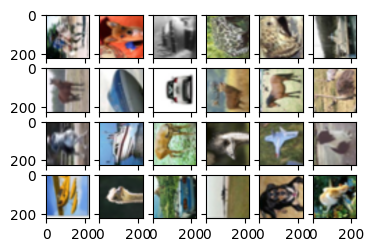

after resize
0.0 1.0


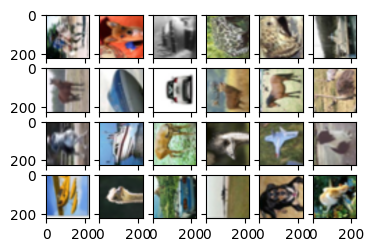

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.44077668 0.5999395


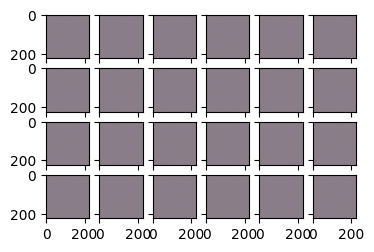

tensor(6019.2056, device='cuda:0', grad_fn=<MulBackward0>) tensor(51091.4844, device='cuda:0', grad_fn=<MulBackward0>) tensor(57110.6914, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


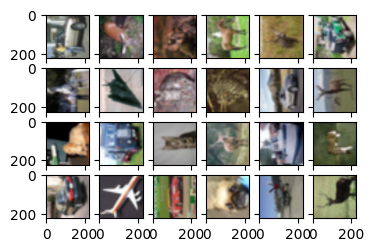

after resize
0.0 1.0


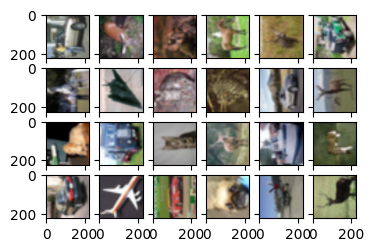

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.0 1.0


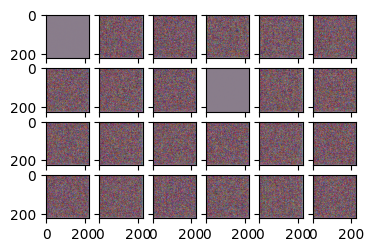

tensor(25208.7949, device='cuda:0', grad_fn=<MulBackward0>) tensor(61728196., device='cuda:0', grad_fn=<MulBackward0>) tensor(61753404., device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


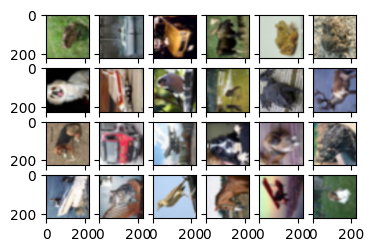

after resize
0.0 1.0


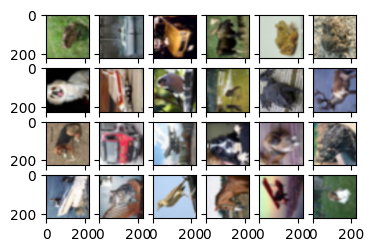

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
2.7198116e-06 0.9999945


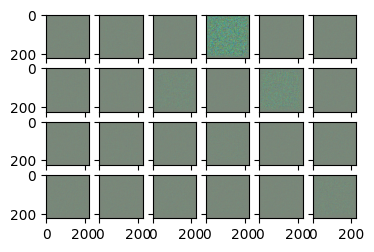

tensor(5790.9409, device='cuda:0', grad_fn=<MulBackward0>) tensor(550203.9375, device='cuda:0', grad_fn=<MulBackward0>) tensor(555994.8750, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


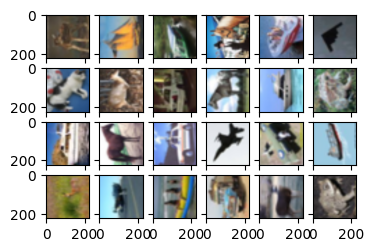

after resize
0.0 1.0


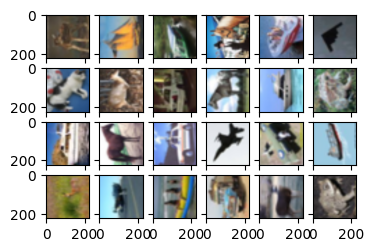

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.35631597 0.6214447


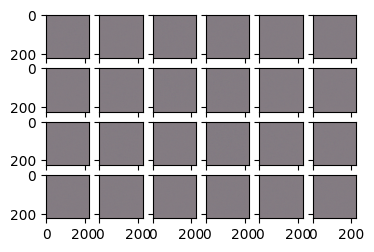

tensor(5700.9126, device='cuda:0', grad_fn=<MulBackward0>) tensor(169264.4844, device='cuda:0', grad_fn=<MulBackward0>) tensor(174965.3906, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


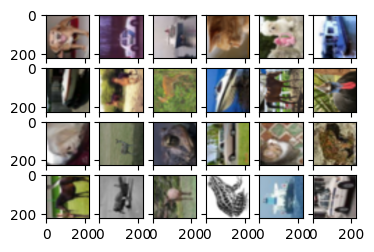

after resize
0.0 1.0


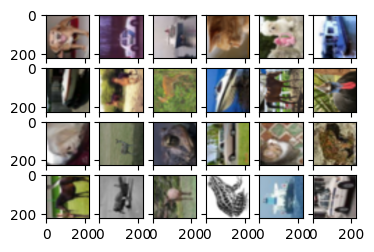

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.2531872 0.725687


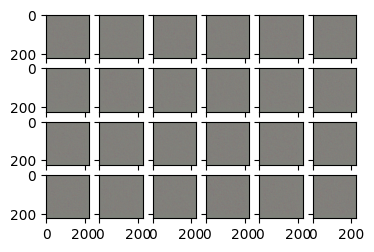

tensor(5273.8472, device='cuda:0', grad_fn=<MulBackward0>) tensor(751683.5625, device='cuda:0', grad_fn=<MulBackward0>) tensor(756957.4375, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.00013430053 1.0


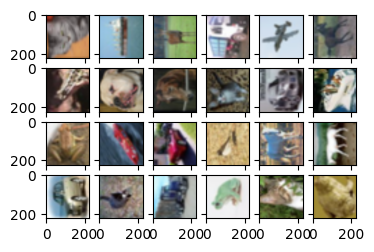

after resize
0.00013430053 1.0


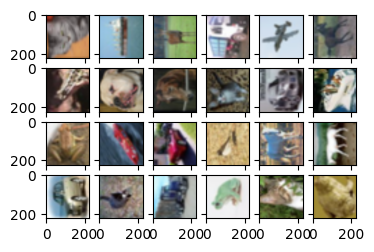

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.0 1.0


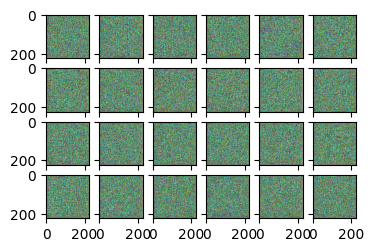

tensor(28978.4395, device='cuda:0', grad_fn=<MulBackward0>) tensor(8.1653e+13, device='cuda:0', grad_fn=<MulBackward0>) tensor(8.1653e+13, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


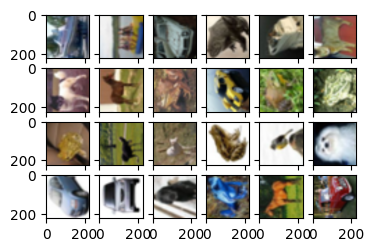

after resize
0.0 1.0


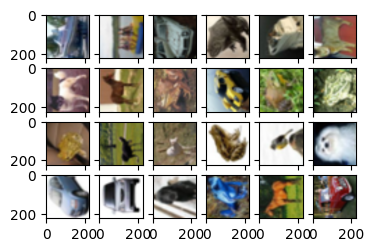

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.00106281 0.99890125


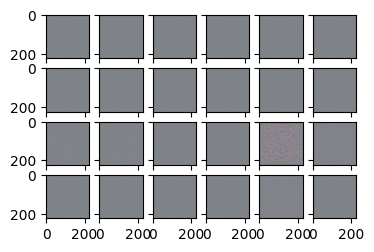

tensor(7009.9619, device='cuda:0', grad_fn=<MulBackward0>) tensor(288543.8750, device='cuda:0', grad_fn=<MulBackward0>) tensor(295553.8438, device='cuda:0', grad_fn=<AddBackward0>)
pixelwise tensor(350498.0938, device='cuda:0', grad_fn=<MseLossBackward0>)
kl tensor([274284.7812, 343320.3125, 237262.7188, 267357.2500, 268507.0312,
        296705.7500, 296993.7500, 256452.1250, 256055.0938, 265408.1250,
        259396.0625, 291130.5312, 236420.9375, 240644.5938, 247964.3750,
        347364.2500, 394912.2500, 314157.7812, 302886.0000, 386415.6562,
        312730.6250, 277294.9375, 225482.2812, 275978.4688, 279049.9688,
        327670.2500, 291387.7500, 306834.4375, 301241.5000, 243499.0312,
        351896.5625, 256698.7500], device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(295553.8438, device='cuda:0', grad_fn=<MeanBackward0>)

before resize
0.0 1.0


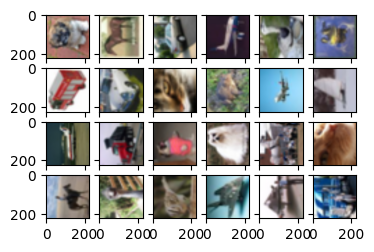

after resize
0.0 1.0


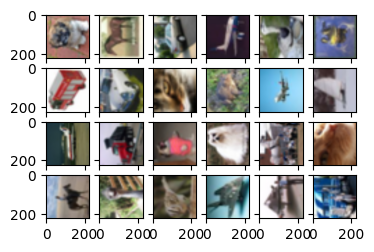

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.0 1.0


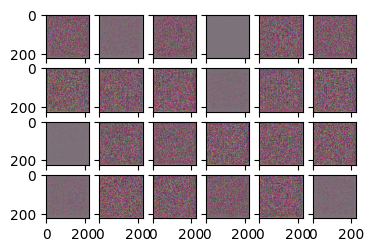

tensor(22366.7051, device='cuda:0', grad_fn=<MulBackward0>) tensor(1351982.6250, device='cuda:0', grad_fn=<MulBackward0>) tensor(1374349.3750, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


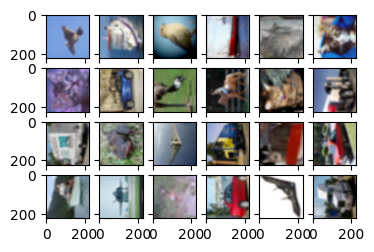

after resize
0.0 1.0


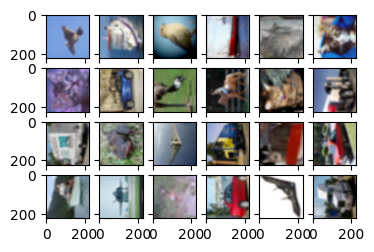

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.0 1.0


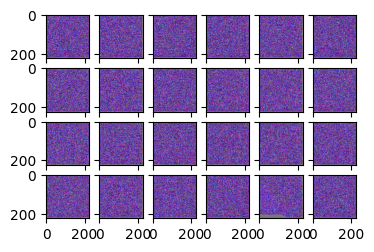

tensor(28764.9941, device='cuda:0', grad_fn=<MulBackward0>) tensor(5.3276e+08, device='cuda:0', grad_fn=<MulBackward0>) tensor(5.3279e+08, device='cuda:0', grad_fn=<AddBackward0>)
before resize
2.2367616e-05 1.0


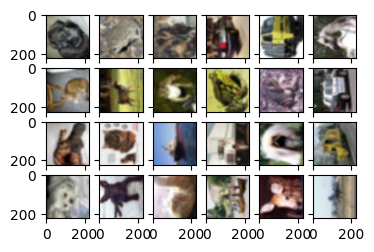

after resize
2.2367616e-05 1.0


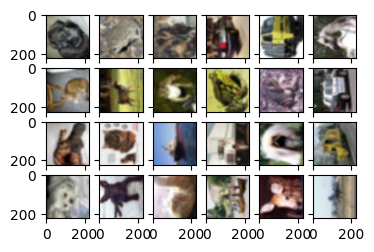

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.41233793 0.5738978


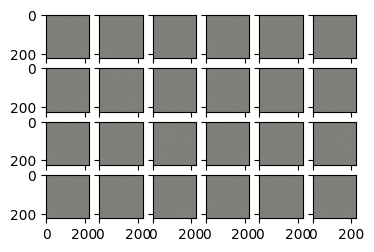

tensor(6678.5361, device='cuda:0', grad_fn=<MulBackward0>) tensor(105607.0938, device='cuda:0', grad_fn=<MulBackward0>) tensor(112285.6328, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


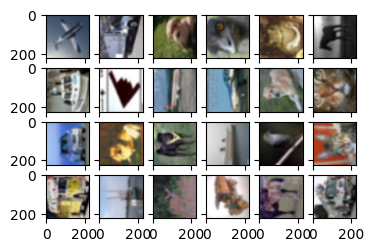

after resize
0.0 1.0


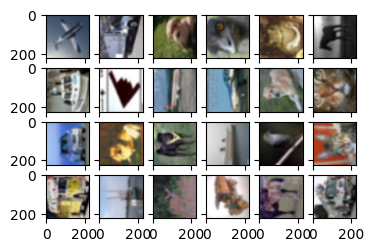

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.29303226 0.6506701


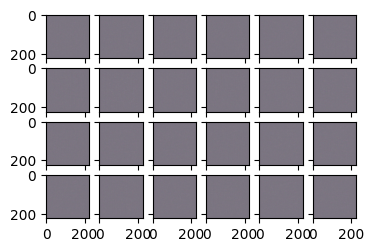

tensor(6283.8525, device='cuda:0', grad_fn=<MulBackward0>) tensor(375975.7500, device='cuda:0', grad_fn=<MulBackward0>) tensor(382259.5938, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


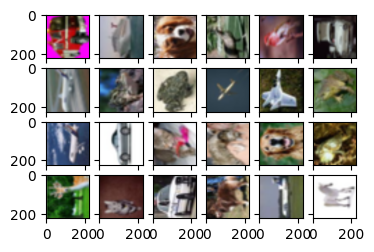

after resize
0.0 1.0


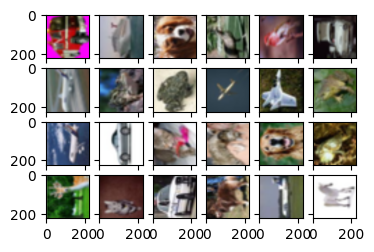

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.010395228 0.9935714


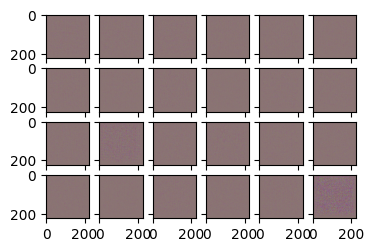

tensor(7296.2935, device='cuda:0', grad_fn=<MulBackward0>) tensor(783063.2500, device='cuda:0', grad_fn=<MulBackward0>) tensor(790359.5625, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


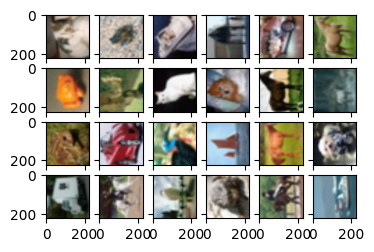

after resize
0.0 1.0


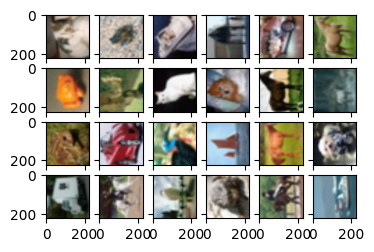

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.0 1.0


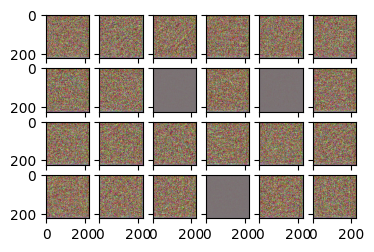

tensor(26853.9785, device='cuda:0', grad_fn=<MulBackward0>) tensor(1.0750e+08, device='cuda:0', grad_fn=<MulBackward0>) tensor(1.0752e+08, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


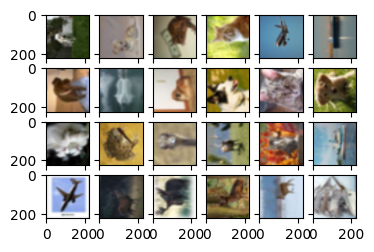

after resize
0.0 1.0


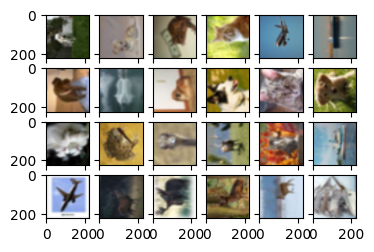

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.28531003 0.758835


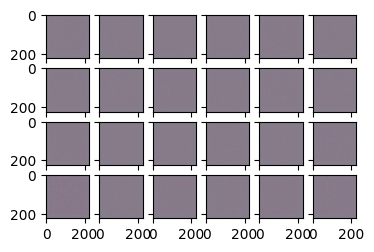

tensor(5694.0972, device='cuda:0', grad_fn=<MulBackward0>) tensor(349488.4062, device='cuda:0', grad_fn=<MulBackward0>) tensor(355182.5000, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


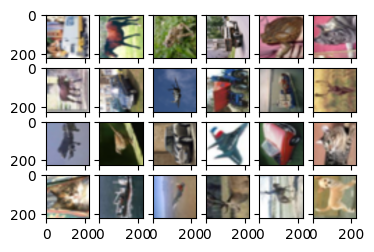

after resize
0.0 1.0


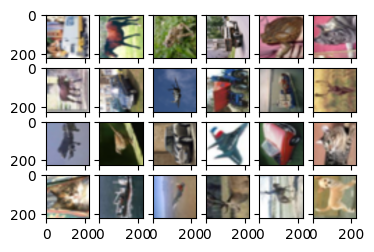

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.4234919 0.56237906


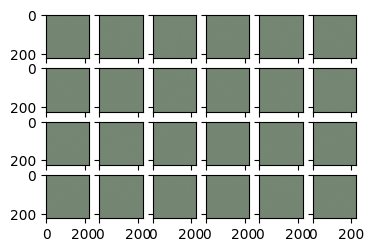

tensor(5394.4194, device='cuda:0', grad_fn=<MulBackward0>) tensor(70284.5781, device='cuda:0', grad_fn=<MulBackward0>) tensor(75679., device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


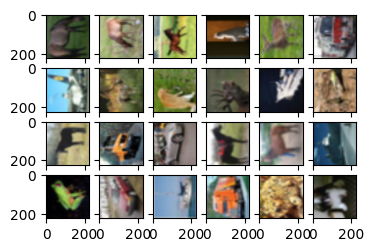

after resize
0.0 1.0


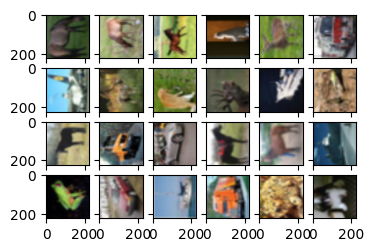

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.06518209 0.9098265


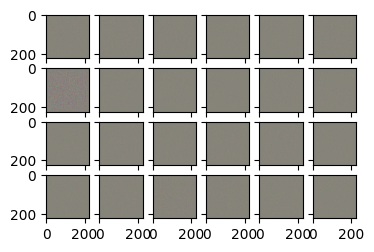

tensor(6100.0400, device='cuda:0', grad_fn=<MulBackward0>) tensor(587478.5625, device='cuda:0', grad_fn=<MulBackward0>) tensor(593578.6250, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


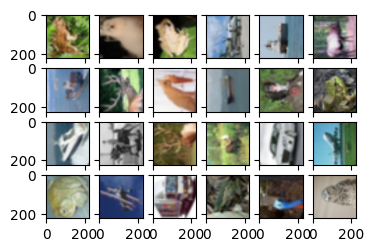

after resize
0.0 1.0


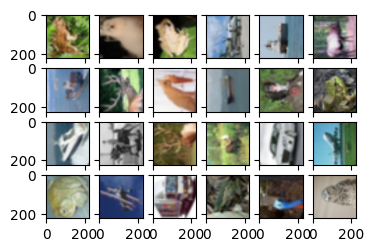

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.34139696 0.6309042


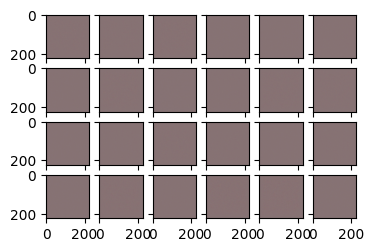

tensor(5258.5376, device='cuda:0', grad_fn=<MulBackward0>) tensor(113839., device='cuda:0', grad_fn=<MulBackward0>) tensor(119097.5391, device='cuda:0', grad_fn=<AddBackward0>)
pixelwise tensor(262926.8750, device='cuda:0', grad_fn=<MseLossBackward0>)
kl tensor([128798.9609, 120135.0469, 159144.1719,  80145.0391,  83980.0312,
         95537.9688,  84951.4141, 148925.9375,  73929.9375,  93278.5391,
        143189.0000, 128978.4531,  85626.5312,  98894.5312, 131481.6094,
        101631.1094,  90193.0000, 101583.7500,  74594.6250, 164280.9062,
         96246.4453, 187054.2656, 213192.5938,  74424.1797, 102928.2266,
        125428.8594, 120526.3828,  87513.6328, 138395.4062, 113073.1562,
         93163.3984, 101620.8594], device='cuda:0', grad_fn=<MulBackward0>)
loss tensor(119097.5391, device='cuda:0', grad_fn=<MeanBackward0>)

before resize
0.0 1.0


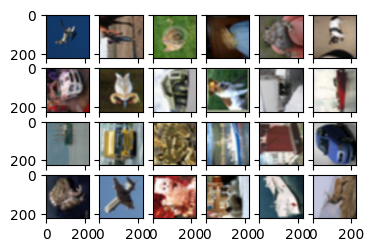

after resize
0.0 1.0


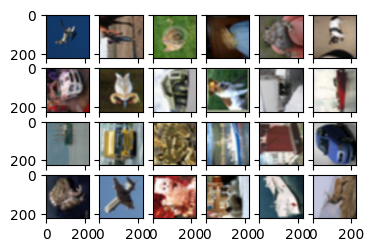

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.2952494 0.69255686


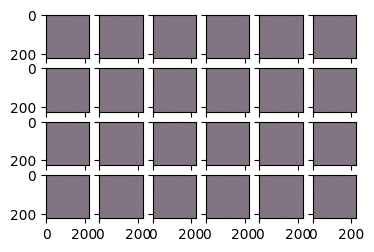

tensor(6201.6499, device='cuda:0', grad_fn=<MulBackward0>) tensor(356944.8125, device='cuda:0', grad_fn=<MulBackward0>) tensor(363146.4688, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


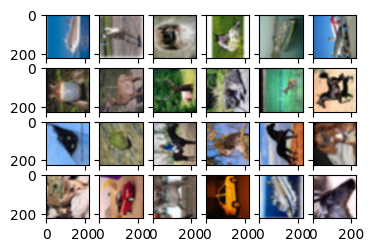

after resize
0.0 1.0


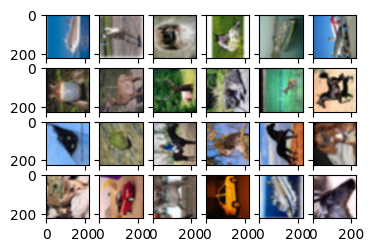

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.37159964 0.646224


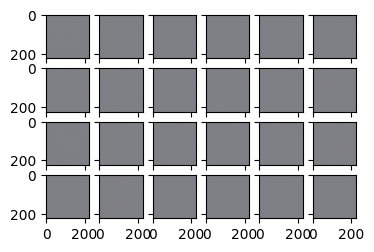

tensor(5600.8911, device='cuda:0', grad_fn=<MulBackward0>) tensor(152538.5312, device='cuda:0', grad_fn=<MulBackward0>) tensor(158139.4219, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


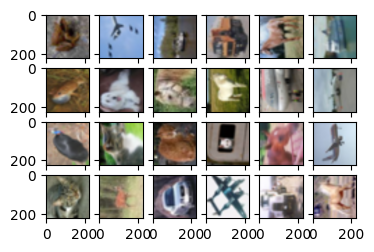

after resize
0.0 1.0


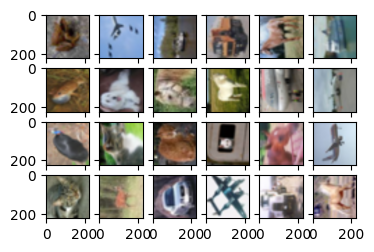

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.0 1.0


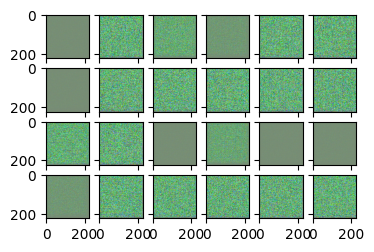

tensor(19129.4551, device='cuda:0', grad_fn=<MulBackward0>) tensor(1.6044e+12, device='cuda:0', grad_fn=<MulBackward0>) tensor(1.6044e+12, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


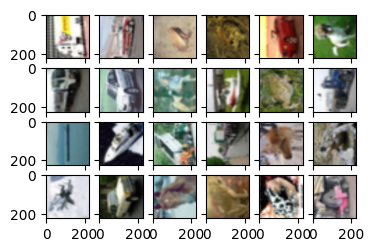

after resize
0.0 1.0


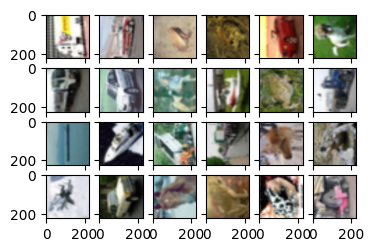

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.0 1.0


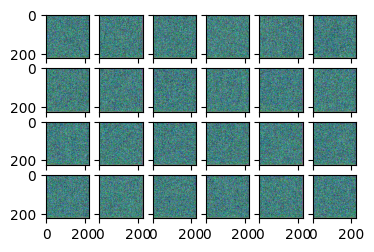

tensor(30691.0039, device='cuda:0', grad_fn=<MulBackward0>) tensor(7.0163e+11, device='cuda:0', grad_fn=<MulBackward0>) tensor(7.0163e+11, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


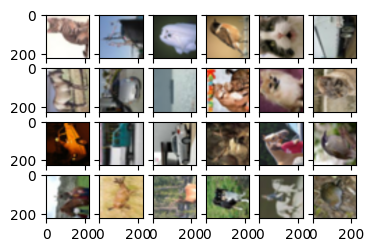

after resize
0.0 1.0


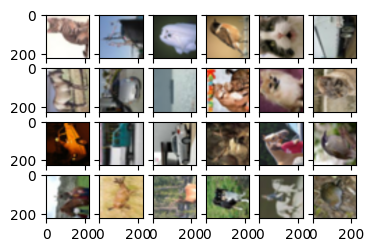

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.00014529994 0.99999154


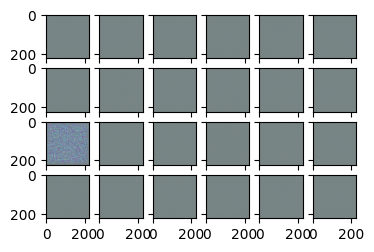

tensor(6126.1211, device='cuda:0', grad_fn=<MulBackward0>) tensor(178511.1250, device='cuda:0', grad_fn=<MulBackward0>) tensor(184637.2500, device='cuda:0', grad_fn=<AddBackward0>)
before resize
0.0 1.0


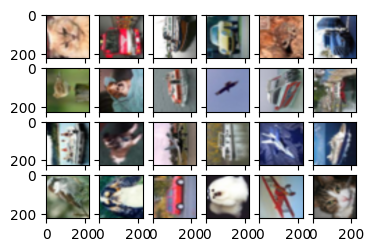

after resize
0.0 1.0


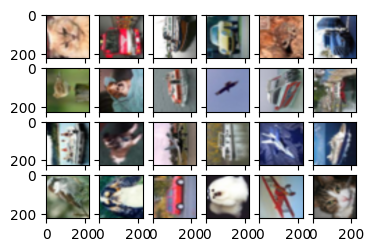

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.460213 0.6067694


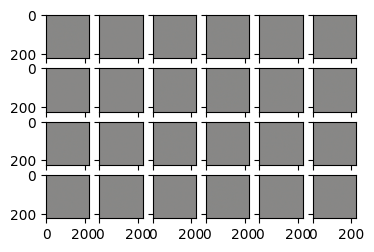

tensor(5673.5938, device='cuda:0', grad_fn=<MulBackward0>) tensor(108971.8438, device='cuda:0', grad_fn=<MulBackward0>) tensor(114645.4375, device='cuda:0', grad_fn=<AddBackward0>)
before resize
5.2287534e-05 1.0


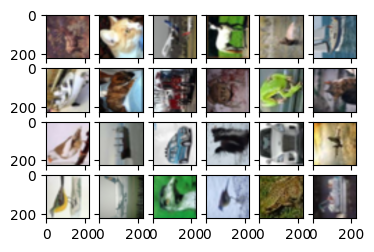

after resize
5.2287534e-05 1.0


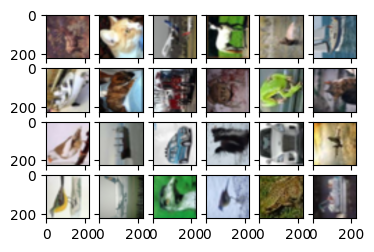

torch.Size([32, 16, 223, 223])
torch.Size([32, 16, 111, 111])
torch.Size([32, 32, 109, 109])
torch.Size([32, 32, 54, 54])
torch.Size([32, 64, 52, 52])
torch.Size([32, 64, 26, 26])
torch.Size([32, 128, 24, 24])
torch.Size([32, 128, 12, 12])
after encoder and decoded
torch.Size([32, 128, 12, 12]) torch.Size([32, 128, 12, 12])
Leakyrelu1 torch.Size([32, 128, 24, 24])
Leakyrelu2 torch.Size([32, 64, 52, 52])
Leakyrelu3 torch.Size([32, 32, 109, 109])
relu4 torch.Size([32, 16, 223, 223])
0.40906733 0.5873164


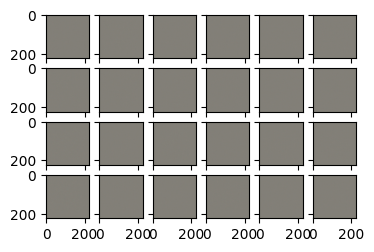

tensor(5851.4360, device='cuda:0', grad_fn=<MulBackward0>) tensor(134217.4531, device='cuda:0', grad_fn=<MulBackward0>) tensor(140068.8906, device='cuda:0', grad_fn=<AddBackward0>)
before resize
4.9673443e-05 1.0


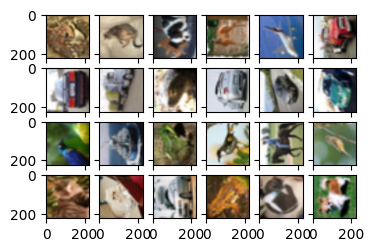

after resize
4.9673443e-05 1.0


In [ ]:
vae.train()
vae.to(device)
total_loss = []
n_steps_per_epoch = len(train_dataloader)
beta = 1
alpha = 2*(10**(-2))
for epoch in range(epochs):
    epochs_loss = []
    print("Epoch:", epoch)
    for i, data in enumerate(train_dataloader):
        # Compute prediction and loss
        X, y = data
        X, y = X.to(device), y.to(device)
        X = _resize_input(X, device)
        X, mean, logvar, sampling, decoded = vae(X)

        kl = - 0.5 * torch.sum(1 + logvar - mean**2 - torch.exp(logvar), axis=1)
        # kl_mean = kl.mean()
        batchsize = X.shape[0]

        x_flat = X.flatten()
        decoded_flat = decoded.flatten()

        pixelwise = loss_fn(x_flat, decoded_flat, reduction='sum')
        # pixelwise_mean = pixelwise.mean()


        loss = alpha * pixelwise.mean() + beta * kl.mean()
        print(pixelwise.mean() * alpha, kl.mean() * beta, loss)
        loss = loss.mean()

        if not i % 10:
          print("pixelwise", pixelwise)
          print("kl", kl)
          print("loss", loss)
          print()

        optimizer.zero_grad()

        # Backpropagation
        loss.backward()
        optimizer.step()

        epochs_loss.append(loss.cpu().detach().numpy())
        metrics = {"train/train_loss": loss,
                    "train/epoch": (i + 1 + (n_steps_per_epoch * epoch)) / n_steps_per_epoch,
                    "train/kl_div": kl,
                    "train/mse_loss": pixelwise,
                    "train/epoch": epoch + 1}

        wandb.log(metrics)


In [ ]:
   plt.imshow(x)

In [ ]:
plt.imshow(test_dataset[50][0].T)
plt.show()

In [ ]:
train_dataset.classes_to_idx

In [ ]:
x_output = vae(test_dataset[50][0].unsqueeze(0).to(device))

In [ ]:
decoded_image = x_output[3].cpu().detach()[0]

In [ ]:
decoded_image = decoded_image.type(torch.uint8)

In [ ]:
decoded_image

In [ ]:
imgplot = plt.imshow(decoded_image.T)
plt.show()

In [ ]:
wandb.finish()

---

In [ ]:
!git clone https://github.com/beamaia/HistoVAE/

Cloning into 'HistoVAE'...
remote: Enumerating objects: 379, done.
remote: Total 379 (delta 0), reused 0 (delta 0), pack-reused 379
Receiving objects: 100% (379/379), 4.64 MiB | 14.57 MiB/s, done.
Resolving deltas: 100% (224/224), done.


In [ ]:
!pwd

/content


In [ ]:
!ls histo

dependencies  figures	README.md	  scripts  txt	  VAE
diagrams      Makefile	requirements.txt  src	   utils


In [ ]:
!cd histo

In [ ]:
!ls

data  drive  histo  sample_data  wandb


In [ ]:
!python histo/scripts/train.py --model_type VariationalConvolutionalAutoencoder

Traceback (most recent call last):
  File "/content/histo/scripts/train.py", line 9, in <module>
    from src.classes import Dataset
ModuleNotFoundError: No module named 'src'


In [ ]:
'''This script demonstrates how to build a variational autoencoder
with Keras and deconvolution layers.
# Reference
- Auto-Encoding Variational Bayes
  https://arxiv.org/abs/1312.6114
'''
import numpy as np
from scipy.stats import norm

from keras.layers import Input, Dense, Lambda, Flatten, Reshape, Layer
from keras.layers import Conv2D, Conv2DTranspose
from keras.models import Model
from keras import backend as K
from keras import metrics
from keras.datasets import mnist, cifar10
import sys
rootdir = '/content/'
sys.path.append(rootdir)
from skimage.transform import resize
from sklearn.model_selection import train_test_split
from keras import optimizers
from keras.callbacks import TensorBoard, EarlyStopping, ModelCheckpoint



np.random.seed(42)

# number of convolutional filters to use
filters = 64
# convolution kernel size
num_conv = 3
batch_size = 32


dataset = 'mnist'

if dataset == 'mnist':
    img_rows, img_cols, img_chns = 28, 28, 1
elif dataset == 'cifar10':
    img_rows, img_cols, img_chns = 32, 32, 3
elif dataset == 'histo-dev':
    img_rows, img_cols, img_chns = 256, 256, 3
elif dataset == '128-patches':
    img_rows, img_cols, img_chns = 128, 128, 3

if K.image_data_format() == 'channels_first':
    original_img_size = (img_chns, img_rows, img_cols)
else:
    original_img_size = (img_rows, img_cols, img_chns)




latent_dim = 16
intermediate_dim = 512
epsilon_std = 1.0
epochs = 100
lr = 0.0001

x = Input(shape=original_img_size)
conv_1 = Conv2D(img_chns,
                kernel_size=(2, 2),
                padding='same', activation='relu')(x)
conv_2 = Conv2D(filters,
                kernel_size=(2, 2),
                padding='same', activation='relu',
                strides=(2, 2))(conv_1)
conv_3 = Conv2D(filters,
                kernel_size=num_conv,
                padding='same', activation='relu',
                strides=1)(conv_2)
conv_4 = Conv2D(filters,
                kernel_size=num_conv,
                padding='same', activation='relu',
                strides=1)(conv_3)
flat = Flatten()(conv_4)
hidden = Dense(intermediate_dim, activation='relu')(flat)

z_mean = Dense(latent_dim)(hidden)
z_log_var = Dense(latent_dim)(hidden)


def sampling(args):
    z_mean, z_log_var = args
    epsilon = K.random_normal(shape=(K.shape(z_mean)[0], latent_dim),
                              mean=0., stddev=epsilon_std)
    return z_mean + K.exp(z_log_var) * epsilon


# note that "output_shape" isn't necessary with the TensorFlow backend
# so you could write `Lambda(sampling)([z_mean, z_log_var])`
print(sampling)
z = Lambda(sampling, output_shape=(latent_dim,))([z_mean, z_log_var])

# we instantiate these layers separately so as to reuse them later


decoder_hid = Dense(intermediate_dim, activation='relu')
decoder_upsample = Dense(filters * int(img_rows/2) * int(img_rows/2), activation='relu')

if K.image_data_format() == 'channels_first':
    output_shape = (batch_size, filters, int(img_rows/2), int(img_rows/2))
else:
    output_shape = (batch_size, int(img_rows/2), int(img_rows/2), filters)

decoder_reshape = Reshape(output_shape[1:])
decoder_deconv_1 = Conv2DTranspose(filters,
                                   kernel_size=num_conv,
                                   padding='same',
                                   strides=1,
                                   activation='relu')
decoder_deconv_2 = Conv2DTranspose(filters,
                                   kernel_size=num_conv,
                                   padding='same',
                                   strides=1,
                                   activation='relu')
if K.image_data_format() == 'channels_first':
    output_shape = (batch_size, filters, 29, 29)
else:
    output_shape = (batch_size, 29, 29, filters)
decoder_deconv_3_upsamp = Conv2DTranspose(filters,
                                          kernel_size=(3, 3),
                                          strides=(2, 2),
                                          padding='valid',
                                          activation='relu')
decoder_mean_squash = Conv2D(img_chns,
                             kernel_size=2,
                             padding='valid',
                             activation='sigmoid')

hid_decoded = decoder_hid(z)
up_decoded = decoder_upsample(hid_decoded)
reshape_decoded = decoder_reshape(up_decoded)
deconv_1_decoded = decoder_deconv_1(reshape_decoded)
deconv_2_decoded = decoder_deconv_2(deconv_1_decoded)
x_decoded_relu = decoder_deconv_3_upsamp(deconv_2_decoded)
x_decoded_mean_squash = decoder_mean_squash(x_decoded_relu)




# Custom loss layer
class CustomVariationalLayer(Layer):
    def __init__(self, **kwargs):
        self.is_placeholder = True
        super(CustomVariationalLayer, self).__init__(**kwargs)

    def vae_loss(self, x, x_decoded_mean_squash):
        print("inside loss?")
        print(x, x_decoded_mean_squash)
        x = K.flatten(x)
        x_decoded_mean_squash = K.flatten(x_decoded_mean_squash)

        print(x, x_decoded_mean_squash)
        xent_loss = img_rows * img_cols * metrics.binary_crossentropy(x, x_decoded_mean_squash)
        kl_loss = - 0.5 * K.mean(1 + z_log_var - K.square(z_mean) - K.exp(z_log_var), axis=-1)
        print(xent_loss, kl_loss)
        return K.mean(xent_loss + kl_loss)

    def call(self, inputs):
        x = inputs[0]
        x_decoded_mean_squash = inputs[1]
        loss = self.vae_loss(x, x_decoded_mean_squash)
        self.add_loss(loss, inputs=inputs)
        # We don't use this output.
        return x



y = CustomVariationalLayer()([x, x_decoded_mean_squash])
vae = Model(x, y)

rmsprop = optimizers.legacy.RMSprop(learning_rate=lr, rho=0.9, epsilon=1e-08, decay=0.0)
# sgd = optimizers.sgd(lr=0.01, momentum=0.0, decay=0.0, nesterov=False)
vae.compile(optimizer=rmsprop, loss=None)



if __name__ == '__main__':
    vae.summary()
    if dataset == 'mnist':
        (x_train, _), (x_test, y_test) = mnist.load_data()

        x_train = x_train.astype('float32') / 255.
        x_train = x_train.reshape((x_train.shape[0],) + original_img_size)
        x_test = x_test.astype('float32') / 255.
        x_test = x_test.reshape((x_test.shape[0],) + original_img_size)



        print('x_train.shape:', x_train.shape)

    elif dataset == 'histo-dev':
        import h5py
        filename = '/hps/nobackup/research/stegle/users/willj/GTEx/data/h5py/patches-all_s-10_p-50.hdf5'
        with h5py.File(filename) as f:
            patches = f['/patches'].value
            labels = f['/labels'].value

        patches = [resize(x, (256, 256)) for x in patches]
        x_train, x_test, y_train, y_test = train_test_split(patches, labels, test_size=0.4, random_state=42)
        x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.5, random_state=42)

        x_train = np.array(x_train, dtype='float32')
        x_test = np.array(x_test, dtype='float32')
        x_val = np.array(x_val, dtype='float32')

        # import pdb; pdb.set_trace()

        print('x_train.shape:', x_train.shape)

    elif dataset == 'cifar10':
        (x_train, _), (x_test, y_test) = cifar10.load_data()
        x_train = x_train.astype('float32') / 255.
        x_test = x_test.astype('float32') / 255.

    if dataset == '128-patches':
        import h5py


        filename = '/hps/nobackup/research/stegle/users/willj/GTEx/data/patches/Lung/GTEX-144GM-0126_128.hdf5'
        with h5py.File(filename) as f:
            patches1 = f['/patches'].value
            labels1 = ['144GM'] * len(patches1)

        filename = '/hps/nobackup/research/stegle/users/willj/GTEx/data/patches/Lung/GTEX-13N1W-0726_128.hdf5'
        with h5py.File(filename) as f:
            patches2 = f['/patches'].value
            labels2 = ['13N1W'] * len(patches2)

        patches = np.concatenate([patches1, patches2])
        labels = labels1 + labels2

        x_train, x_test, y_train, y_test = train_test_split(patches, labels, test_size=0.4, random_state=42)
        x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.5, random_state=42)

        x_train = np.array(x_train, dtype='float32') / 255.
        x_test = np.array(x_test, dtype='float32') / 255.
        x_val = np.array(x_val, dtype='float32') / 255.
        import pdb; pdb.set_trace()


    print(x_train)
    vae.fit(x_train, shuffle=True, epochs=epochs, batch_size=batch_size)

    vae.save('models/vae-{dataset}.hdf5'.format(dataset=dataset))



    # build a model to project inputs on the latent space
    encoder = Model(x, z_mean)
    encoder.save('models/encoder-{dataset}.hdf5'.format(dataset=dataset))

    # display a 2D plot of the digit classes in the latent space
    x_test_encoded = encoder.predict(x_test, batch_size=batch_size)
    # plt.figure(figsize=(6, 6))
    # plt.scatter(x_test_encoded[:, 0], x_test_encoded[:, 1], c=y_test)
    # plt.colorbar()
    # plt.show()

    # build a digit generator that can sample from the learned distribution
    decoder_input = Input(shape=(latent_dim,))
    _hid_decoded = decoder_hid(decoder_input)
    _up_decoded = decoder_upsample(_hid_decoded)
    _reshape_decoded = decoder_reshape(_up_decoded)
    _deconv_1_decoded = decoder_deconv_1(_reshape_decoded)
    _deconv_2_decoded = decoder_deconv_2(_deconv_1_decoded)
    _x_decoded_relu = decoder_deconv_3_upsamp(_deconv_2_decoded)
    _x_decoded_mean_squash = decoder_mean_squash(_x_decoded_relu)
    generator = Model(decoder_input, _x_decoded_mean_squash)
    generator.save('models/generator-{dataset}.hdf5'.format(dataset=dataset))


<function sampling at 0x7f97582cc940>
inside loss?
Tensor("Placeholder:0", shape=(None, 28, 28, 1), dtype=float32) Tensor("Placeholder_1:0", shape=(None, 28, 28, 1), dtype=float32)
Tensor("custom_variational_layer_10/Reshape:0", shape=(None,), dtype=float32) Tensor("custom_variational_layer_10/Reshape_1:0", shape=(None,), dtype=float32)
Tensor("custom_variational_layer_10/mul_2:0", shape=(), dtype=float32) KerasTensor(type_spec=TensorSpec(shape=(None,), dtype=tf.float32, name=None), name='tf.math.multiply_19/Mul:0', description="created by layer 'tf.math.multiply_19'")
Model: "model_10"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_11 (InputLayer)       [(None, 28, 28, 1)]          0         []                            
                                                                                                  
 conv2d_50

TypeError: in user code:

    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1401, in train_function  *
        return step_function(self, iterator)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1384, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1373, in run_step  **
        outputs = model.train_step(data)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1151, in train_step
        loss = self.compute_loss(x, y, y_pred, sample_weight)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1209, in compute_loss
        return self.compiled_loss(
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/compile_utils.py", line 329, in __call__
        self._total_loss_mean.update_state(
    File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/metrics_utils.py", line 77, in decorated
        result = update_state_fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/metrics/base_metric.py", line 140, in update_state_fn
        return ag_update_state(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/metrics/base_metric.py", line 528, in update_state  **
        update_total_op = self.total.assign_add(value_sum)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/keras_tensor.py", line 285, in __array__
        raise TypeError(

    TypeError: You are passing KerasTensor(type_spec=TensorSpec(shape=(), dtype=tf.float32, name=None), name='tf.math.reduce_sum_9/Sum:0', description="created by layer 'tf.math.reduce_sum_9'"), an intermediate Keras symbolic input/output, to a TF API that does not allow registering custom dispatchers, such as `tf.cond`, `tf.function`, gradient tapes, or `tf.map_fn`. Keras Functional model construction only supports TF API calls that *do* support dispatching, such as `tf.math.add` or `tf.reshape`. Other APIs cannot be called directly on symbolic Kerasinputs/outputs. You can work around this limitation by putting the operation in a custom Keras layer `call` and calling that layer on this symbolic input/output.
